### This jupyter notebook contains codes for integration of ALMA-R model with Raspberry Pi 5 computer

**Author : Umidjon Sattorov. Machine Learning engineer**

**STT models**

https://scoop.sh/

One of the most powerful and very popular model which can convert speech to text is Whisper AI developed by Open AI company. 

In [ ]:
%pip install -U openai-whisper

In [6]:
# Importing necessary libraries
import whisper 

model = whisper.load_model("tiny")

#loading audio
audio = whisper.load_audio("./additional/russian.m4a")
audio = whisper.pad_or_trim(audio)

# make log-Mel spectrogram and move to the same device as the model
mel = whisper.log_mel_spectrogram(audio, n_mels=model.dims.n_mels).to(model.device)

# detect the spoken language
_, probs = model.detect_language(mel)
print(f"Detected language: {max(probs, key=probs.get)}")

# decode the audio
options = whisper.DecodingOptions()
result = whisper.decode(model, mel, options)

# print the recognized text
print(result.text)

Detected language: ru
В ДВЕРЬ ДВЕРЬ ДВЕРЬ АПЛОДИСМЕНТЫ Это история началась в 1992 году, когда мне было 7 лет. Выденодецкую площадку. Я обнаружила, что дети, с которыми еще вчера ей играла, не хотят со мной общаться. Я убежала домой к маме в слезах, спросила, почему они со мной не играют. Она просто сказала, потому что ты русская.


I think tiny model is just speedy and even respond with great results in real time application. But when it comes to technical abilities I have right now, I can use turbo model instead.

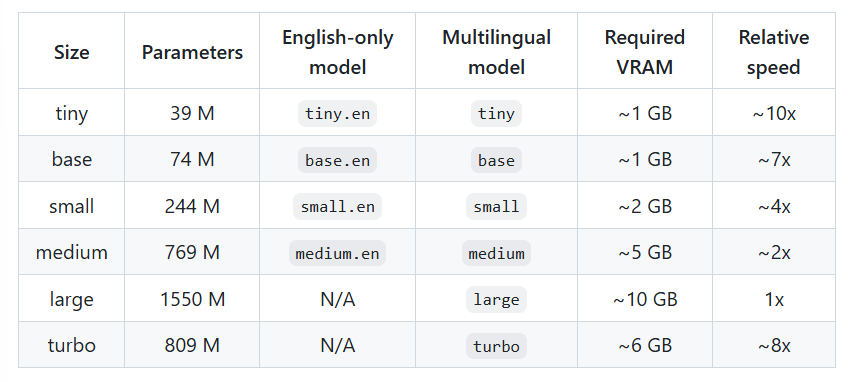

**ALMA-R 1.5B model**

Because we cannot train custom model right now, we can us pretrained models like ALMA-R 1.5B model for LLM purpose. It should work as CHATGPT suggested me to use this model as this model have capability to work with Russian texts.

After some research online, I found out that ALMA-R 1.5B model is deleted and removed from huggingface. I try to use Delta-R(developed by Ilya Gusev) instead of ALMA model.

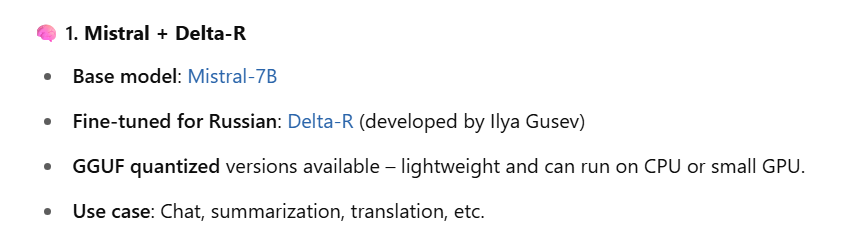

Precompiled llama wheels

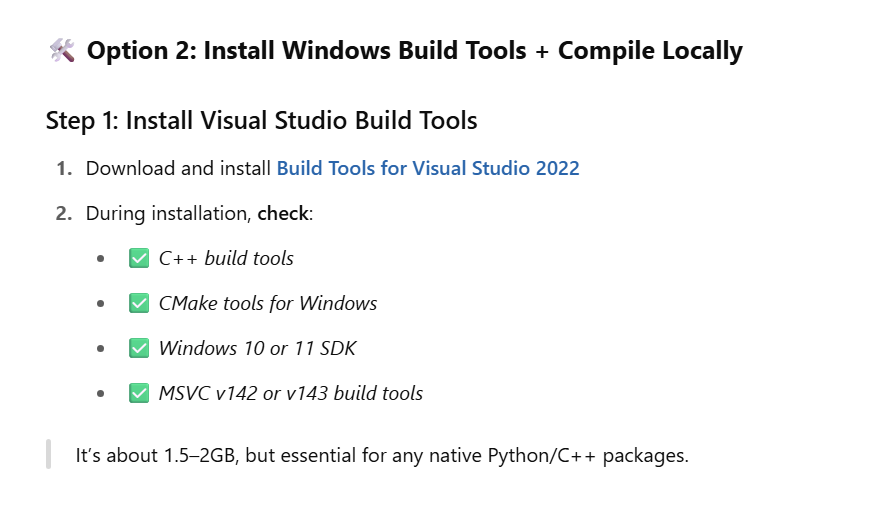

In [ ]:
%pip install llama-cpp-python --prefer-binary

In [7]:
from llama_cpp import Llama 

#Loading GGUF model
llm = Llama(model_path = "./additional/model-q4_K.gguf", n_ctx = 512)

llama_model_loader: loaded meta data with 21 key-value pairs and 291 tensors from ./additional/model-q4_K.gguf (version GGUF V2)
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = models
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096


llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:                 llama.attention.head_count u32              = 32
llama_model_loader: - kv   8:              llama.attention.head_count_kv u32              = 8
llama_model_loader: - kv   9:     llama.attention.layer_norm_rms_epsilon f32              = 0.000010
llama_model_loader: - kv  10:                       llama.rope.freq_base f32              = 10000.000000
llama_model_loader: - kv  11:                          general.file_type u32              = 15
llama_model_loader: - kv  12:                       tokenizer.ggml.model str              = llama
llama_model_loader: - kv  13:                      tokenizer.ggml.tokens arr[str,32002]   = ["<unk>", "<s>", "</s>", "<0x00

In [8]:
# Running inference in Russian
output = llm("Привет! Как дела?", max_tokens=100)

print(output["choices"][0]["text"])

llama_perf_context_print:        load time =     848.78 ms
llama_perf_context_print: prompt eval time =     846.56 ms /     9 tokens (   94.06 ms per token,    10.63 tokens per second)
llama_perf_context_print:        eval time =   18189.63 ms /    99 runs   (  183.73 ms per token,     5.44 tokens per second)
llama_perf_context_print:       total time =   19070.86 ms /   108 tokens


 Хочу поделиться своим опытом.

Мне удалось создать простой сервис, который позволяет пользователям покупать товары в онлайн магазине без регистрации.

Сервис работает следующим образом:

1. Пользователи могут добавлять товары в корзину без регистрации.
2.


Conclusion : It seems like this model didn't work correctly and I really think I have to use bloomz. I tried also Microsoft Phi model. In the following section of the work, I try to use boomz model using huggingface library

In [ ]:
# pip install -q transformers
from transformers import AutoModelForCausalLM, AutoTokenizer

checkpoint = "bigscience/bloomz-560m"

tokenizer = AutoTokenizer.from_pretrained(checkpoint)
model = AutoModelForCausalLM.from_pretrained(checkpoint)

inputs = tokenizer.encode("Translate to English: Je t’aime.", return_tensors="pt")
outputs = model.generate(inputs)
print(tokenizer.decode(outputs[0]))


**Gemma 3 for LLM purpose**

In [ ]:
%pip install ollama

In [15]:
import ollama

response = ollama.chat(model = 'gemma3', messages = [
  {'role': 'user', 'content': 'Какие книги посоветуешь для изучения машинного обучения на русском языке?'}
])

print(response['message']['content'])


Отлично, давайте подберем книги для изучения машинного обучения на русском языке. Вот несколько вариантов, сгруппированных по уровню сложности и подходу:

**1. Для начинающих (Без математического фона):**

* **"Машинное обучение. Визуальное обучение" (Джейсон Райнер):**  Это, пожалуй, самый популярный и дружелюбный учебник для начинающих.  Книга полна иллюстраций и примеров на Python с использованием библиотек scikit-learn и NumPy.  В ней объясняются базовые концепции, алгоритмы и как их применять. Очень рекомендую с неё начать.
    * **Плюсы:** Легко читается, много примеров, визуальное представление концепций.
    * **Минусы:**  Меньше математики, поэтому не закладывает глубоких знаний.
* **"Введение в машинное обучение" (Дмитрий Пивоваров):**  Книга написана простым языком и объясняет основные алгоритмы машинного обучения, такие как линейная регрессия, логистическая регрессия, деревья решений и др.  Она содержит много практических примеров и упражнений.
    * **Плюсы:**  Хорошо стру

**TTS model**

For text-to-speech model, I am going to use Conqui AI as it is considered one of the most consistent model for this purpose.

In [1]:
from TTS.api import TTS 

tts = TTS(model_name = "tts_models/en/ljspeech/glow-tts")
tts.tts_to_file(text = "Hello, I am Raspberry Pi assistant!", file_path = "out.wav")

JSONDecodeError: Expecting value: line 11 column 21 (char 549)

**Let's just use eSpeak before figuring out the problem with conqui AI**

In [ ]:
%pip install pyttsx3

In [24]:
import pyttsx3

engine = pyttsx3.init()
engine.say("Testing default voice")
engine.runAndWait()


It didn't work correctly as I wanted. There is not any voice playing.

**Russian TTS model, last attempt**

In [ ]:
%pip install transformers soundfile

In [6]:
from transformers import pipeline

tts = pipeline(
    "text-to-speech",
    model="Misha24-10/F5-TTS_RUSSIAN",
    framework="pt"
)

# Add accent marks if needed
text = "Привет, как д+ела?"
audio = tts(text)
# audio["wav"] contains the waveform; save it to .wav file:
with open("out.wav", "wb") as f:
    f.write(audio["wav"])


OSError: Misha24-10/F5-TTS_RUSSIAN does not appear to have a file named config.json. Checkout 'https://huggingface.co/Misha24-10/F5-TTS_RUSSIAN/main' for available files.

**Last attempt**

In [ ]:
%pip install --upgrade transformers accelerate

In [16]:
from transformers import VitsModel, AutoTokenizer
import torch

model = VitsModel.from_pretrained("facebook/mms-tts-rus")
tokenizer = AutoTokenizer.from_pretrained("facebook/mms-tts-rus")

text = response['message']['content']
inputs = tokenizer(text, return_tensors="pt")

with torch.no_grad():
    output = model(**inputs).waveform


In [17]:
from IPython.display import Audio

Audio(output, rate=model.config.sampling_rate)


**Full pipeline of work**

In [ ]:
%pip install sounddevice

**Warning : Instead of Russian TTS model, I opted to use Kokoro English TTS model for great performance in my bot**

In [ ]:
%pip install -q kokoro>=0.9.2 soundfile

In [ ]:
# Importing necessary libraries
import sounddevice as sd 
import numpy as np
import scipy.io.wavfile as wav
import whisper 
from transformers import VitsModel, AutoTokenizer
import torch
import ollama
from kokoro import KPipeline

# Function for real-time audio capture
def record_audio(duration = 5, samplerate = 24000, filename = "input.wav"):
    print("Recording")
    audio = sd.rec(int(duration * samplerate), samplerate = samplerate, channels = 1)
    sd.wait()
    wav.write(filename, samplerate, audio)
    return filename 

# Trancribe with Whisper
whisper_model = whisper.load_model("turbo")
def transcribe_audio(filename = "input.wav") :
    result = whisper_model.transcribe(filename)
    print(result["text"])
    return result["text"]

# Gemma 3 model
def model_llm(model="gemma3", role="user", message="Hello"):
    response = ollama.chat(model=model, messages=[
        {"role": role, "content": message}
    ], options={"num_predict": 60})
    reply = response['message']['content'].strip()
    return reply

# Audio generation 
kokoro_pipeline = KPipeline(lang_code='a')
def speak_loudly(text : str, voice: str = 'af_heart') :
    generator = kokoro_pipeline(text, voice=voice)
    
    for i, (_, _, audio) in enumerate(generator):
        sd.play(audio, samplerate=24000)
        sd.wait()

def main_loop() :
    while True :
        record_audio(duration = 10)
        text = transcribe_audio()
        if "exit" in text.lower():
            print("👋 Exiting.")
            break
        response = model_llm(message = text)
        speak_loudly(text = response)

c:\Users\user\Documents\workshop\alma_r_model\.venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\user\Documents\workshop\alma_r_model\.venv\lib\site-packages\torch\_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


c:\Users\user\Documents\workshop\alma_r_model\.venv\lib\site-packages\torch\nn\modules\rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
c:\Users\user\Documents\workshop\alma_r_model\.venv\lib\site-packages\torch\nn\utils\weight_norm.py:30: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


In [2]:
text = "I am bot. How about your today."
speak_loudly(text)

In [ ]:
text_1 = "Machine Learning (ML) is revolutionizing medical science by enabling data-driven diagnosis, treatment, and research. It is widely used for early disease detection (e.g., cancer, pneumonia, diabetes), medical imaging analysis (X-rays, MRIs, CT scans), drug discovery, genomics, and personalized treatment plans."
speak_loudly(text = text_1)

In [2]:
if __name__ == "__main__":
    main_loop()

Recording


c:\Users\user\Documents\workshop\alma_r_model\.venv\lib\site-packages\whisper\transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


 Can you say something?
Recording


KeyboardInterrupt: 